# Solver / NFE sweep

Load the Arioso checkpoint (EMA weights) and render a few held-out clips under **every
integration setting** so the graininess can be A/B'd by ear. This rules sampling
discretization **in or out** before any training is touched (item #1 of the v1 fix ladder).

For each clip we sweep `(solver, steps)` over Euler / Heun / midpoint at matched NFE
(`NFE = steps * nfe_per_step`) and compare:

1. **Audio** — GT (the vocoder ceiling) vs. the model output at each setting.
2. **Mel / delta** — for reference, the lowest- and highest-NFE Euler output vs. GT.
3. **MAE / RMSE** — per-setting mel error, printed as a table.

The GT audio is the GT mel through the same frozen BigVGAN-v2 vocoder, so any difference you
hear is the model (and the *solver*), not the vocoder ceiling. A fixed `SEED` means every
setting scores the **same** clips.

> Run from the **project root** so the `Arioso` / `DataSynthesizer` / `common` packages import.

In [ ]:
%matplotlib inline
import os
import random
import numpy as np
import torch
import matplotlib.pyplot as plt
from IPython.display import display, Audio, Markdown

from common.config import SR
from common.vocoder import load_vocoder, vocode
from DataSynthesizer.config import DEFAULT_OUT

from Arioso.config import CKPT_DIR, PRIOR_MEL_DIR, AriosoConfig
from Arioso.model import AriosoModel
from Arioso.splits import make_split
from Arioso.clips import enumerate_clips
from Arioso.infer import generate_mel
from Arioso.solvers import SOLVERS

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUT_DIR = DEFAULT_OUT                       # 'data' — the dataset root
CKPT = os.path.join(CKPT_DIR, "7-7-offline-aug", "checkpoint_final.pt")
N_EXAMPLES = 3                              # held-out clips A/B'd across every setting
WEIGHTS = "ema"                             # inference uses the EMA weights
SEED = 0                                    # fixed so every setting scores the *same* clips

# Solver x steps sweep. NFE = steps * nfe_per_step (Euler 1/step, Heun & midpoint 2/step),
# so these rows cover matched function-eval budgets ~ {16, 32, 64, 100}.
SWEEP = [("euler", 16),# ("euler", 32), ("euler", 64), ("euler", 100),
         ("euler", 100),
         ("heun", 50), #("heun", 32), ("heun", 50),          # NFE 32 / 64 / 100
        #  ("midpoint", 16), #("midpoint", 32)
         ]                # NFE 32 / 64


def nfe(solver, steps):
    return steps * SOLVERS[solver][1]


cfg = AriosoConfig()
print(f"device={DEVICE}  ckpt={CKPT}")
print("sweep:", [f"{s}@{n} (NFE {nfe(s, n)})" for s, n in SWEEP])

device=cuda  ckpt=Arioso/models\7-7-offline-aug\checkpoint_final.pt
sweep: ['euler@16 (NFE 16)', 'heun@16 (NFE 32)', 'midpoint@16 (NFE 32)']


## Load the final checkpoint

In [2]:
# Load the checkpoint FIRST, then build the model from ITS embedded config (cfg_from_dict):
# pre-conditioning checkpoints reconstruct the exact old architecture; conditioned ones add cond.
from Arioso.config import cfg_from_dict

ckpt = torch.load(CKPT, map_location=DEVICE)
cfg = cfg_from_dict(ckpt.get("cfg") or {})
model = AriosoModel(cfg).to(DEVICE)
model.load_state_dict(ckpt[WEIGHTS])
model.eval()
print(f"loaded step {ckpt.get('step', '?')}  |  {model.num_params() / 1e6:.1f}M params  |  weights='{WEIGHTS}'")

# The frozen BigVGAN-v2 vocoder (mel -> waveform). Also asserts the mel contract.
voc = load_vocoder(device=DEVICE)

c:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\torch\_utils.py:99: UserWarning: expandable_segments not supported on this platform (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\c10/cuda/CUDAAllocatorConfig.h:28.)
  untyped_storage = torch.UntypedStorage(self.size(), device=device)


loaded step 20000  |  34.1M params  |  weights='ema'


c:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Removing weight norm...


## Pick the validation clips

Randomly select `N_EXAMPLES` held-out **recordings** and take one random clip from each (so the
examples are from distinct performances rather than overlapping windows of the same one). `SEED`
is fixed above so the draw is reproducible and every solver setting is scored on the same clips.

In [3]:
rng = random.Random(SEED)

split = make_split(OUT_DIR, cfg)
val_clips = enumerate_clips(OUT_DIR, split["val"], cfg)
print(f"val recordings: {len(split['val'])}   val clips: {len(val_clips)}")

# Group clips by recording, randomly pick N_EXAMPLES recordings, then a random clip from each.
by_recording = {}
for c in val_clips:
    by_recording.setdefault(c.basename, []).append(c)

chosen_recordings = rng.sample(sorted(by_recording), k=min(N_EXAMPLES, len(by_recording)))
examples = [rng.choice(by_recording[b]) for b in chosen_recordings]

for c in examples:
    dur = (c.end - c.start) / cfg.sr * cfg.hop
    print(f"  {c.basename}  frames {c.start}:{c.end}  (~{dur:.1f}s)")

val recordings: 74   val clips: 56029
  Wohlfahrt_Op45-39_BernardChevalier_ztj_dBul8fU-0000-0115  frames 3392:4244  (~9.9s)
  Wohlfahrt_Op45-39_BrianClement_QU4_IrlYPhs-0000-0110  frames 6070:6935  (~10.0s)
  Kayser_Op20-04_JPRafferty_49hp2uSHLqI-0000-0097  frames 5050:5911  (~10.0s)


## Run the sweep

For each clip: load the prior mel (`x0`) and GT mel (`x1`), vocode GT once (the ceiling), then
integrate `x0` under **every `(solver, steps)` setting** and vocode each output. Per-setting mel
MAE/RMSE is printed; everything is stored in `results` for the plot / audio cells below.

In [4]:
prior_dir = os.path.join(OUT_DIR, PRIOR_MEL_DIR)
target_dir = os.path.join(OUT_DIR, "target_mel")


def load_clip_mels(c):
    """Prior (x0) and GT (x1) mel slices for a clip, each [128, T] float32."""
    x0 = np.load(os.path.join(prior_dir, c.basename + ".npy"), mmap_mode="r")[:, c.start:c.end]
    x1 = np.load(os.path.join(target_dir, c.basename + ".npy"), mmap_mode="r")[:, c.start:c.end]
    return np.ascontiguousarray(x0, dtype=np.float32), np.ascontiguousarray(x1, dtype=np.float32)


results = []
for i, c in enumerate(examples):
    x0, x1 = load_clip_mels(c)
    gt_audio = vocode(voc, torch.from_numpy(x1[None]).float())     # vocoder ceiling, once per clip
    runs = []
    for solver, steps in SWEEP:
        out_mel = generate_mel(model, x0, cfg, DEVICE, solver=solver, steps=steps)
        out_audio = vocode(voc, torch.from_numpy(out_mel[None]).float())
        delta = out_mel - x1
        runs.append({"solver": solver, "steps": steps, "nfe": nfe(solver, steps),
                     "label": f"{solver} steps={steps} (NFE {nfe(solver, steps)})",
                     "out_mel": out_mel, "out_audio": out_audio,
                     "mae": float(np.mean(np.abs(delta))),
                     "rmse": float(np.sqrt(np.mean(delta ** 2)))})
    results.append({"basename": c.basename, "prior_mel": x0, "gt_mel": x1,
                    "gt_audio": gt_audio, "runs": runs})
    print(f"[{i + 1}/{len(examples)}] {c.basename}")
    for r in runs:
        print(f"    {r['label']:<28}  MAE {r['mae']:.4f}  RMSE {r['rmse']:.4f}")

[1/3] Wohlfahrt_Op45-39_BernardChevalier_ztj_dBul8fU-0000-0115
    euler steps=16 (NFE 16)       MAE 0.8969  RMSE 1.1429
    heun steps=16 (NFE 32)        MAE 0.8945  RMSE 1.1440
    midpoint steps=16 (NFE 32)    MAE 0.8944  RMSE 1.1465
[2/3] Wohlfahrt_Op45-39_BrianClement_QU4_IrlYPhs-0000-0110
    euler steps=16 (NFE 16)       MAE 0.8742  RMSE 1.2360
    heun steps=16 (NFE 32)        MAE 0.8842  RMSE 1.2569
    midpoint steps=16 (NFE 32)    MAE 0.8953  RMSE 1.2732
[3/3] Kayser_Op20-04_JPRafferty_49hp2uSHLqI-0000-0097
    euler steps=16 (NFE 16)       MAE 0.8325  RMSE 1.0612
    heun steps=16 (NFE 32)        MAE 0.8574  RMSE 1.0979
    midpoint steps=16 (NFE 32)    MAE 0.8747  RMSE 1.1217


## Mel reference plots

Audio is the primary grain signal, but for reference we plot the **lowest- and highest-NFE
Euler** output of the first clip against GT (prior / output / GT / delta). Plotting every setting
is verbose; the audio cell below covers the full sweep.

### `Wohlfahrt_Op45-39_BernardChevalier_ztj_dBul8fU-0000-0115` — euler steps=16 (NFE 16)

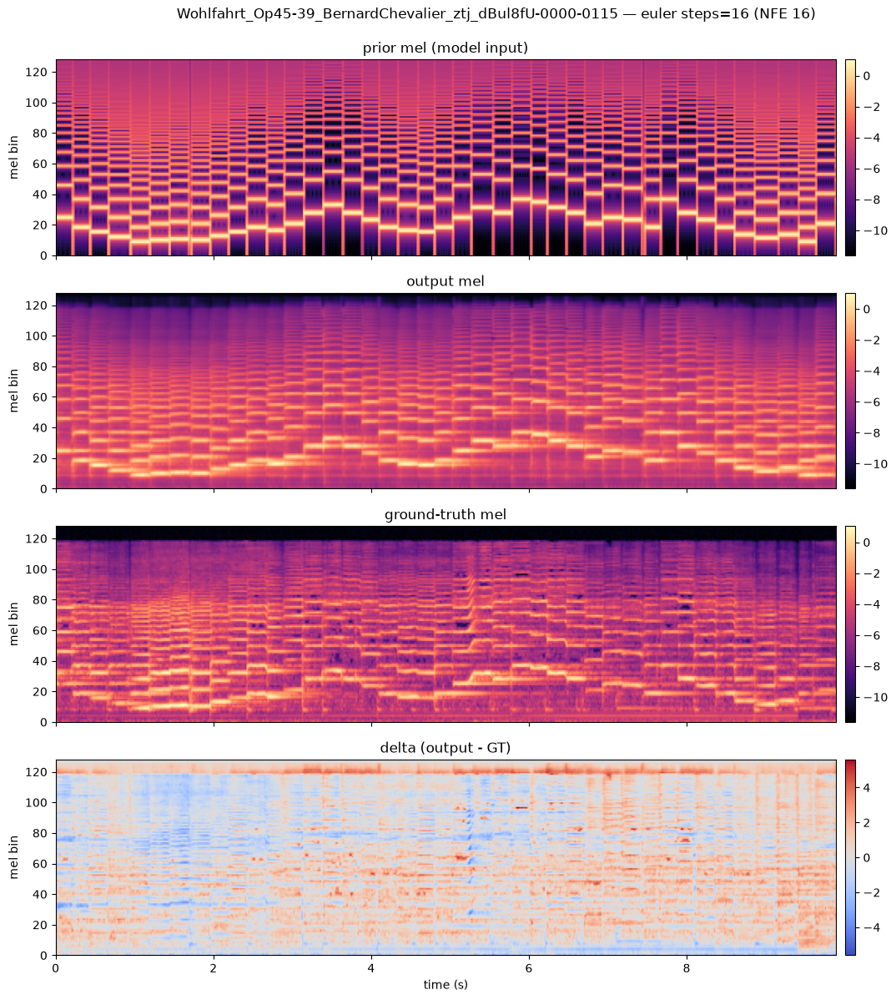

mel MAE 0.8969   mel RMSE 1.1429


### `Wohlfahrt_Op45-39_BernardChevalier_ztj_dBul8fU-0000-0115` — euler steps=16 (NFE 16)

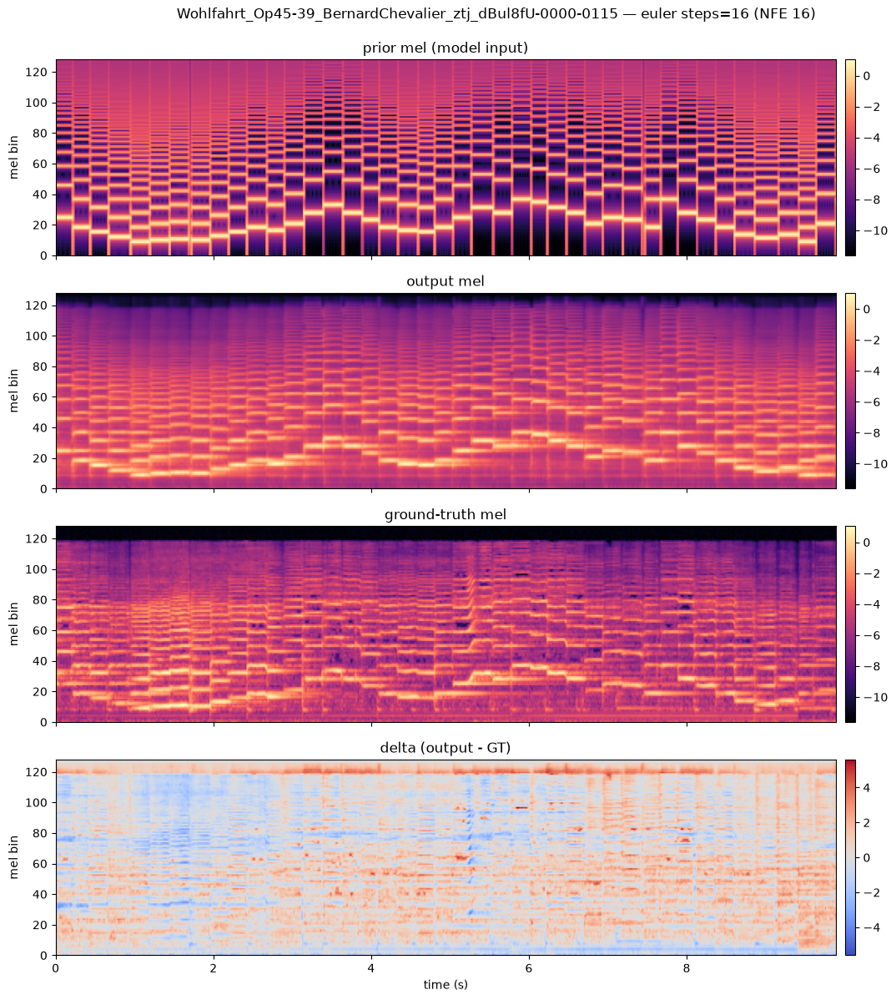

mel MAE 0.8969   mel RMSE 1.1429


In [5]:
def plot_comparison(prior_mel, out_mel, gt_mel, title):
    """Prior, output, GT mels (shared color scale) + the delta (output - GT)."""
    delta = out_mel - gt_mel
    vmin = min(prior_mel.min(), out_mel.min(), gt_mel.min())
    vmax = max(prior_mel.max(), out_mel.max(), gt_mel.max())
    dlim = np.abs(delta).max()
    extent = [0, out_mel.shape[1] / cfg.sr * cfg.hop, 0, cfg.n_mels]

    fig, axes = plt.subplots(4, 1, figsize=(12, 12), sharex=True)
    for ax, data, name, kw in [
        (axes[0], prior_mel, "prior mel (model input)", dict(vmin=vmin, vmax=vmax, cmap="magma")),
        (axes[1], out_mel, "output mel", dict(vmin=vmin, vmax=vmax, cmap="magma")),
        (axes[2], gt_mel, "ground-truth mel", dict(vmin=vmin, vmax=vmax, cmap="magma")),
        (axes[3], delta, "delta (output - GT)", dict(vmin=-dlim, vmax=dlim, cmap="coolwarm")),
    ]:
        im = ax.imshow(data, origin="lower", aspect="auto", extent=extent, **kw)
        ax.set_ylabel("mel bin")
        ax.set_title(name)
        fig.colorbar(im, ax=ax, pad=0.01)
    axes[-1].set_xlabel("time (s)")
    fig.suptitle(title, y=0.995)
    fig.tight_layout()
    return fig


# Reference plot: lowest- and highest-NFE Euler output of the first clip vs GT.
ref = results[0]
euler_runs = [r for r in ref["runs"] if r["solver"] == "euler"]
for r in [euler_runs[0], euler_runs[-1]]:
    title = f"{ref['basename']} — {r['label']}"
    display(Markdown(f"### `{ref['basename']}` — {r['label']}"))
    fig = plot_comparison(ref["prior_mel"], r["out_mel"], ref["gt_mel"], title)
    display(fig)
    plt.close(fig)
    print(f"mel MAE {r['mae']:.4f}   mel RMSE {r['rmse']:.4f}")

## Compare audio across the sweep

Per clip: GT first (the vocoder ceiling), then the model output at **every `(solver, steps)`
setting**. A/B the Euler 16→100 rows for the grain-vs-NFE trend, and the Heun / midpoint rows
against Euler at matched NFE — if grain disappears as NFE rises (or with a 2nd-order solver at
the same NFE), discretization is the cause.

In [6]:
for i, r in enumerate(results):
    display(Markdown(f"### Example {i + 1}/{len(results)} — `{r['basename']}`"))
    print("ground-truth audio (GT mel -> vocoder, the ceiling):")
    display(Audio(r["gt_audio"], rate=SR))
    for run in r["runs"]:
        print(f"{run['label']}   MAE {run['mae']:.4f}  RMSE {run['rmse']:.4f}")
        display(Audio(run["out_audio"], rate=SR))

### Example 1/3 — `Wohlfahrt_Op45-39_BernardChevalier_ztj_dBul8fU-0000-0115`

ground-truth audio (GT mel -> vocoder, the ceiling):


euler steps=16 (NFE 16)   MAE 0.8969  RMSE 1.1429


heun steps=16 (NFE 32)   MAE 0.8945  RMSE 1.1440


midpoint steps=16 (NFE 32)   MAE 0.8944  RMSE 1.1465


### Example 2/3 — `Wohlfahrt_Op45-39_BrianClement_QU4_IrlYPhs-0000-0110`

ground-truth audio (GT mel -> vocoder, the ceiling):


euler steps=16 (NFE 16)   MAE 0.8742  RMSE 1.2360


heun steps=16 (NFE 32)   MAE 0.8842  RMSE 1.2569


midpoint steps=16 (NFE 32)   MAE 0.8953  RMSE 1.2732


### Example 3/3 — `Kayser_Op20-04_JPRafferty_49hp2uSHLqI-0000-0097`

ground-truth audio (GT mel -> vocoder, the ceiling):


euler steps=16 (NFE 16)   MAE 0.8325  RMSE 1.0612


heun steps=16 (NFE 32)   MAE 0.8574  RMSE 1.0979


midpoint steps=16 (NFE 32)   MAE 0.8747  RMSE 1.1217
